SpaceColonization does not have any external dependencies. Here we import Plots.jl to visualize results.

In [1]:
include("SpaceColonization.jl")
using SpaceColonization
using Plots
gr()

Plots.GRBackend()

# Simple Example 

We will begin with a simple example. To run the space colonization algorithm we must first populate a space with some attractors. The attractors are simply points. We must also define the location of the root, or where the branching originates from. 

For this example we use a 10x10 grid with 100 attractors with the root right in the center. Branch spacing will be 0.1 units.

In [2]:
#Domain for random placement of attractors
domain=[10 10]

#Number of attractors
natt=100

#Root Locations
rootloc=[5 5]

#Size of branch discretization 
branchStep=0.1;


Next we use these two functions to initialize our attractors and roots. The attractors are uniformly sampled over our 10x10 grid. 

In [3]:
#Initialize Attractors
attractors=initAttractors([rand(natt)*domain[1] rand(natt)*domain[2]]);

#Initialize set of branches, V
roots=initRoots(rootloc);


To run the algorithm we simply input these parameters into the function.

In [4]:
brout = spacecol(roots, attractors, branchStep);

Now we want to visualize the results. These two functions take the custom data types and turn them into nx3 matrices where n is the number of branches or attractors. 

In [5]:
branches = branch2scatter(brout)
attr = attractor2scatter(attractors);

We can input these matrices directly into a scatter plot. Since this is a 2d problem we ignore the third dimension.

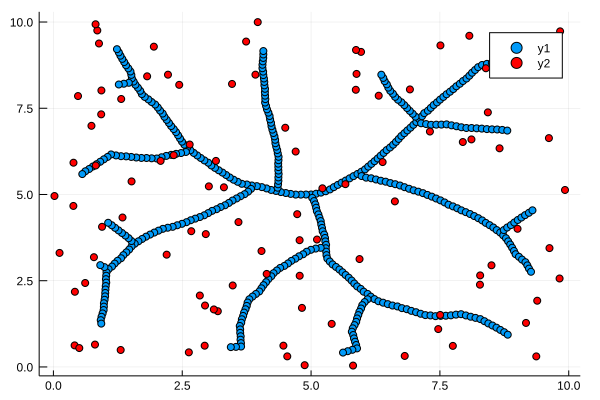

In [6]:
scatter(branches[:,1],branches[:,2], markershape = :circle)
scatter!(attr[:,1],attr[:,2], markercolor = :red)


# Chaning the kill and influence distances

When not specified, the influence distance is infinite. That means that attractors very far away from branches still have an effect. The kill distance determines how close a branch can get to an attractor before the attractor is removed. A removed attractor no longer has an effect on any branches. The kill distance defaults to 10 times the branch spacing and cannot be less than the branch step.

We can easily add these parameters into the function with the dk and di parameters. We will start with the kill distance.

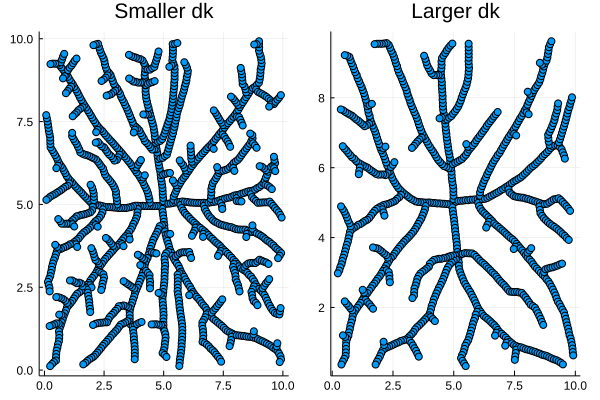

In [7]:
natt=300
attractors=initAttractors([rand(natt)*domain[1] rand(natt)*domain[2]]);

smallkill = spacecol(roots, attractors, branchStep, dk = .2);
largekill = spacecol(roots, attractors, branchStep, dk = .5);

small = branch2scatter(smallkill)
large = branch2scatter(largekill)

s = scatter(small[:,1], small[:,2], markershape = :circle, title = "Smaller dk")
l = scatter(large[:,1], large[:,2], markershape = :circle, title = "Larger dk")

plot(s, l, layout = (1, 2), legend = false)

You can see that a small kill distance means that the branches must get closer to the attractors. The result is many small branches for small kill distances.

Next we look at what the influence distance does.

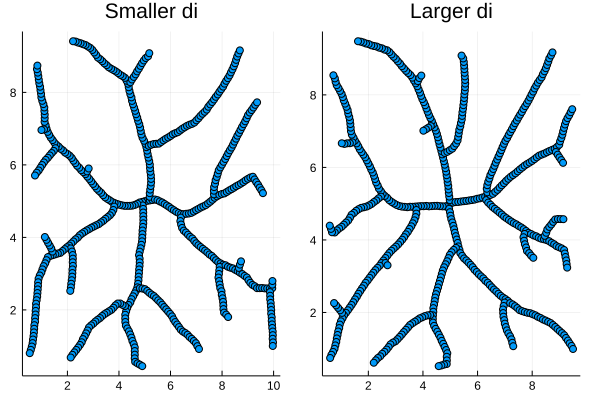

In [8]:
smallinfl = spacecol(roots, attractors, branchStep, di = 2);
largeinfl = spacecol(roots, attractors, branchStep, di = 20);

small = branch2scatter(smallinfl)
large = branch2scatter(largeinfl)

s = scatter(small[:,1], small[:,2], markershape = :circle, title = "Smaller di")
l = scatter(large[:,1], large[:,2], markershape = :circle, title = "Larger di")

plot(s, l, layout = (1, 2), legend = false)

You can see that the larger influence distance makes the branches extend more smoothly. The smaller influence distance is more jagged.

# Iteration limit

Certain parameter sets will have trouble with this algorithm. The iteration limit is a parameter which defaults to 1000. If it takes more than that number of iterations you will get a warning and the algorithm will stop. This is most likely due to a very small branch step but may also be indicative of errors, such as the branch circling around an attractor or getting stuck between two attractors. You should be able to figure out what the problem is by visualizing the results.

In [9]:
#1. Too small of branch step
branchStep = 0.005
ex1 = spacecol(roots, attractors, branchStep);

br1 = branch2scatter(ex1)
att = attractor2scatter(attractors)

scatter(br1[:,1], br1[:,2], markershape = :circle, title = "Too small of branch step")
scatter!(att[:,1], att[:,2], markershape = :circle, markercolor = :red)

### Possible solutions:
#### 1. Increase the branch step
If your branches are not stuck then you probably just need to increase the step size.

#### 2. Change some other parameters such as kill distance, number and placement of attractors, etc.
This is if the algorithm seems like it should be working but seems to be getting stuck between attractors or some other weird behavior. Please contact me if you observe weird behavior.

#### 3. Increase the iteration limit
For large problems this may be the only solution. You will have a high computational cost and produce many many branches but it can be done by passing the parameter iterLim. See below for example.

In [10]:
#1. Too small of branch step
branchStep = 0.005
ex1 = spacecol(roots, attractors, branchStep, iterLim = 2000);

br1 = branch2scatter(ex1)
att = attractor2scatter(attractors)

scatter(br1[:,1], br1[:,2], markershape = :circle, title = "With increased iterLim")
scatter!(att[:,1], att[:,2], markershape = :circle, markercolor = :red)

# Fun examples

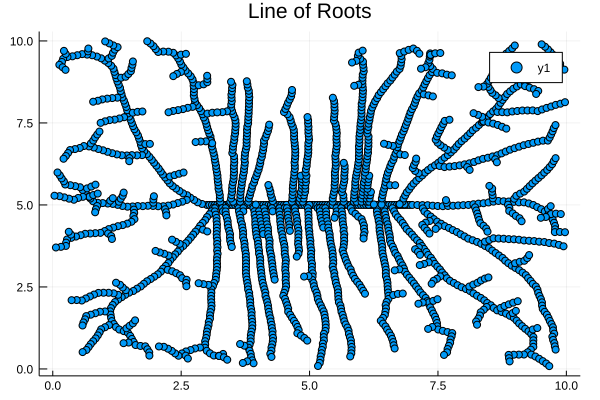

In [11]:
# Line of roots

roots =initRoots([3:.05:7 5+zeros(length(3:.05:7))])
attractors = initAttractors([rand(300)*10 rand(300)*10])

tree = spacecol(roots, attractors, .1, dk = .15, iterLim = 2000)

treepts = branch2scatter(tree)

scatter(treepts[:,1], treepts[:,2], markershape = :circle, title = "Line of Roots")
